# Быстрый style transfer

![](https://miro.medium.com/max/2166/1*8bbp3loQjkLXaIm_QBfD8w.jpeg)

В этом ноутбуке мы реализуем алгоритм для переноса стиля.

[Классический](https://arxiv.org/abs/1508.06576) алгоритм для style transfer работает медленно: для того чтобы его применить к одному изображению, нужно прогнать целую процедуру оптимизации. Идея для его ускорения тривиальна, как всё в deep learning: предсказывать результат этой процедуры оптимизации отдельной нейросетью.

![](https://user-images.githubusercontent.com/37034031/42068027-830719f4-7b84-11e8-9e87-088f1e476aab.png)

Эта идея была предложена в работе 2016 года под названием ["Perceptual Losses for Real-Time Style Transfer and Super-Resolution"](https://arxiv.org/abs/1603.08155). Код для ноутбука основан на примере [`fast_neural_style`](https://github.com/pytorch/examples/tree/master/fast_neural_style) из репозитория `pytorch/examples`.



In [1]:
import io
import requests
import os
import datetime
from collections import namedtuple
from pathlib import Path
from typing import Optional

from tqdm.notebook import tqdm
from PIL import Image

import numpy as np

import matplotlib.pyplot as plt
%matplotlib inline

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.tensorboard import SummaryWriter
from torchvision import datasets
from torchvision import models
from torchvision import transforms

In [2]:
%load_ext tensorboard

In [3]:
np.random.seed(42)
torch.manual_seed(42)

In [4]:
def torch_image_to_numpy(image_torch):
    """Convert PyTorch tensor to Numpy array.
    :param image_torch: [0..1]-normalized PyTorch float CHW Tensor.
    :returns: Numpy uint8 HWC array in range [0..255].
    """
    assert len(image_torch.shape) == 3, 'Have you forgotten to remove the batch dimension?'
    image_np = image_torch.permute(1, 2, 0).numpy()
    image_np = image_np * 255 + 0.5
    image_np = np.clip(image_np, 0, 255)
    image_np = image_np.astype(np.uint8)
    return image_np

def get_datetime():
    return datetime.datetime.now().isoformat(sep='_', timespec='milliseconds').replace(':', '-')

## Датасет

Для обучения генератора картинок нам понадобится датасет. Подойдёт более-менее любой датасет, в котором распределение картинок похоже на то, на котором мы потом будем применять сетку. Здесь я предлагаю использовать датасет [Flickr8k](http://hockenmaier.cs.illinois.edu/8k-pictures.html), который выложен на [Kaggle](https://www.kaggle.com/adityajn105/flickr8k).

In [5]:
data_root = Path('flickr8k')

if not data_root.exists():
    !gdown https://drive.google.com/uc?id=1DEEYahajtFjxkWXdRHp5hXF1H952tAD2
    !unzip -q flickr8k.zip -d $data_root
    assert data_root.exists()

Downloading...
From: https://drive.google.com/uc?id=1DEEYahajtFjxkWXdRHp5hXF1H952tAD2
To: /content/flickr8k.zip
1.11GB [00:13, 83.2MB/s]


Датасет вообще-то предназначается для image captioning, то есть он содержит пары из картинок и текста, описывающего эту картинку. Текст мы использовать не будем.

Давайте посмотрим на этот датасет глазами.

In [6]:
!ls -l $data_root

total 3644
-rw-r--r-- 1 root root 3319294 Apr 27  2020 captions.txt
drwxr-xr-x 2 root root  409600 Jun  3 15:21 Images


In [7]:
!ls {data_root}/Images | wc -l

8091


А вот так выглядят аннотации, которые мы не будем использовать:

In [8]:
!head {data_root}/captions.txt

image,caption
1000268201_693b08cb0e.jpg,A child in a pink dress is climbing up a set of stairs in an entry way .
1000268201_693b08cb0e.jpg,A girl going into a wooden building .
1000268201_693b08cb0e.jpg,A little girl climbing into a wooden playhouse .
1000268201_693b08cb0e.jpg,A little girl climbing the stairs to her playhouse .
1000268201_693b08cb0e.jpg,A little girl in a pink dress going into a wooden cabin .
1001773457_577c3a7d70.jpg,A black dog and a spotted dog are fighting
1001773457_577c3a7d70.jpg,A black dog and a tri-colored dog playing with each other on the road .
1001773457_577c3a7d70.jpg,A black dog and a white dog with brown spots are staring at each other in the street .
1001773457_577c3a7d70.jpg,Two dogs of different breeds looking at each other on the road .


В Torchvision есть удобный класс `ImageFolder`, который позволяет загружать разного рода картиночные датасеты. В нашем случае можно его использовать примерно так:

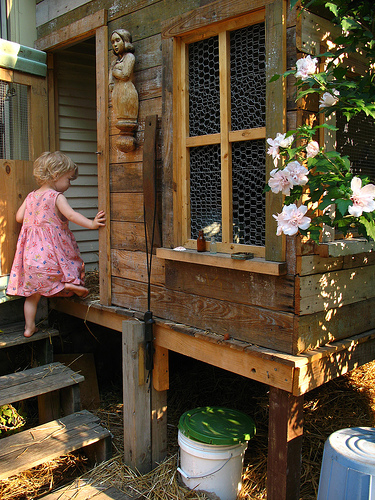

In [9]:
dataset = datasets.ImageFolder(data_root)
dataset[0][0]

Но нам понадобится, как обычно, сделать некоторую предобработку этих картинок, прежде чем мы сможем передать их на вход в нейросеть. Давайте в этот раз сделаем такую предобработку:

* Масштабирование так, чтобы меньшая сторона изображения стала длиной 256 пикселей, с сохранением соотношения сторон;
* Вырезание квадрата из центра изображения;
* Преобразование `PIL.Image` в `torch.Tensor`.

In [10]:
image_size = 256

transform = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(256),
    transforms.ToTensor(),
    # Почему мы не делаем .to(device) прямо в transform:
    # https://discuss.pytorch.org/t/to-device-gives-an-error-when-used-inside-transforms-compose/51387
])

dataset = datasets.ImageFolder(data_root, transform=transform)
dataset

Dataset ImageFolder
    Number of datapoints: 8091
    Root location: flickr8k
    StandardTransform
Transform: Compose(
               Resize(size=256, interpolation=bilinear)
               CenterCrop(size=(256, 256))
               ToTensor()
           )

Как обычно, заведём dataloader:

In [11]:
dataloader = torch.utils.data.DataLoader(dataset, batch_size=4, shuffle=True)

## Картинка со стилем

In [12]:
def get_image(url):
    response = requests.get(url)
    return Image.open(io.BytesIO(response.content))

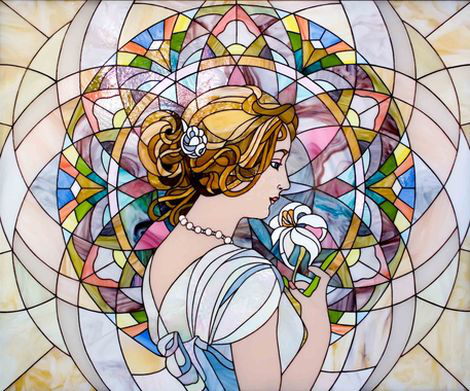

In [13]:
style_url = 'https://github.com/pytorch/examples/raw/master/fast_neural_style/images/style-images/mosaic.jpg'
style_image = get_image(style_url)
style_image

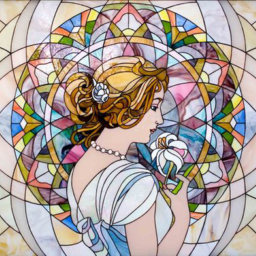

In [14]:
style_tensor = transform(style_image)
Image.fromarray(torch_image_to_numpy(style_tensor))

## Картинка для валидации

Во время обучения сетки-генератора мы будем периодически проверять текущее качество на этой картинке:

In [15]:
content_url = 'https://github.com/pytorch/examples/raw/master/fast_neural_style/images/content-images/amber.jpg'

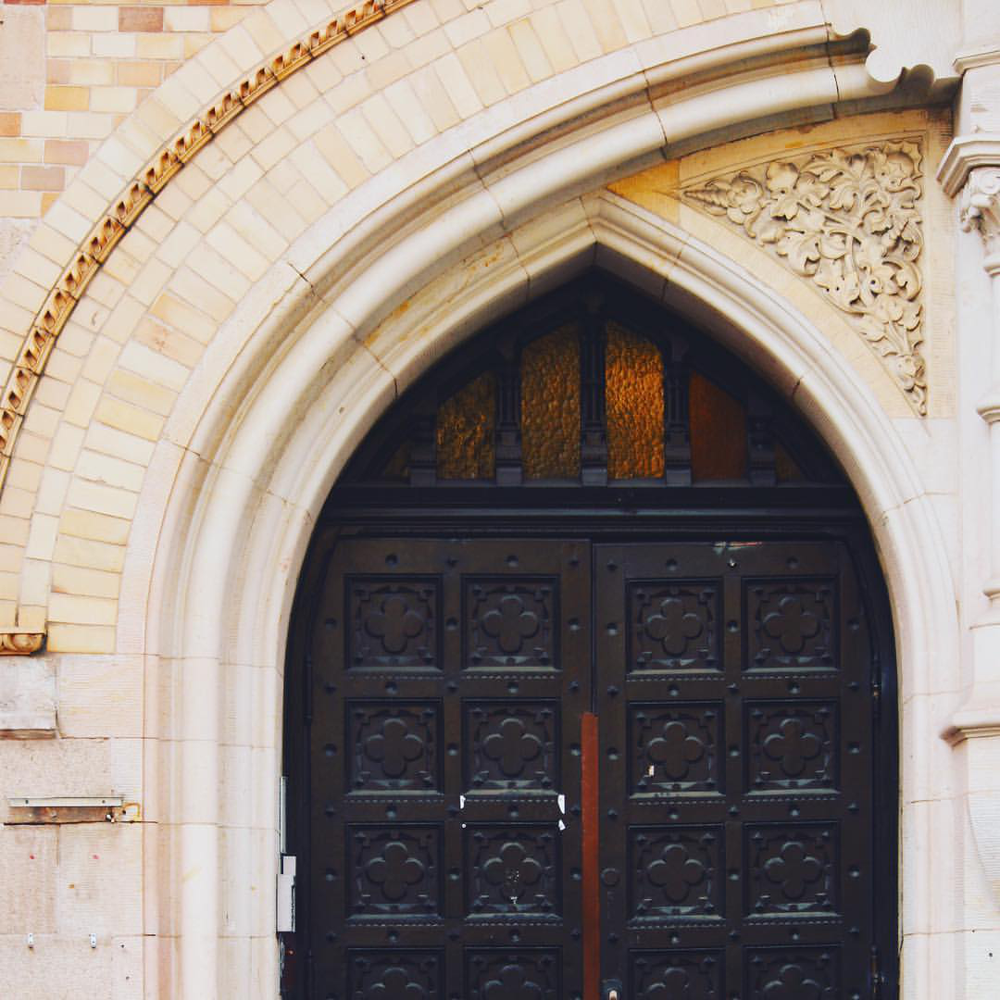

In [16]:
content_image = get_image(content_url)
content_image

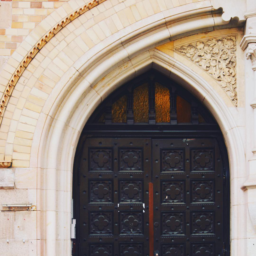

In [17]:
content_tensor = transform(content_image)
Image.fromarray(torch_image_to_numpy(content_tensor))

## VGG

In [18]:
!nvidia-smi

Thu Jun  3 15:21:35 2021       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 465.27       Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla K80           Off  | 00000000:00:04.0 Off |                    0 |
| N/A   68C    P8    32W / 149W |      0MiB / 11441MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [19]:
device = 'cuda:0' if torch.cuda.is_available() else 'cpu'

Для обучения понадобится прогонять то, что сгенерировал генератор, через сеть VGG-16, и извлекать из неё промежуточные представления. Вспомним, что такое VGG-16:

In [20]:
# Сразу укажем pretrained=True, чтобы веса скачались заранее
vgg16 = models.vgg16(pretrained=True)
vgg16

Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to /root/.cache/torch/hub/checkpoints/vgg16-397923af.pth


VGG(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU(inplace=True)
    (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): ReLU(inplace=True)
    (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU(inplace=True)
    (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (15): ReLU(inplace=True)
    (16): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1

На семинаре мы будем использовать промежуточные представления, которые получаются перед **первыми 4 макс-пулингами**, сразу после ReLU.

Это не означает, что нельзя использовать другие. Вы можете поэкспериментировать с любыми представлениями!

In [21]:
# Какие у этих ReLU индексы?
layer_indices = [3, 8, 15, 22]

In [22]:
VggOutputs = namedtuple("VggOutputs", ['relu1_2', 'relu2_2', 'relu3_3', 'relu4_3'])


class Vgg16(torch.nn.Module):
    def __init__(self):
        super().__init__()
        
        # Для удобства загоним прямо внутрь нашего класса imagenet-нормализацию,
        # чтобы потом о ней не думать
        self.register_buffer('imagenet_mean', torch.tensor([0.485, 0.456, 0.406]).reshape(1, 3, 1, 1))
        self.register_buffer('imagenet_std', torch.tensor([0.229, 0.224, 0.225]).reshape(1, 3, 1, 1))
        
        # Приготовьтесь к тому, чтобы в forward() выдавать значения промежуточных слоёв
        vgg_pretrained_features = models.vgg16(pretrained=True).features
        self.slice1 = vgg_pretrained_features[0:layer_indices[0] + 1]
        self.slice2 = vgg_pretrained_features[layer_indices[0] + 1:layer_indices[1] + 1]
        self.slice3 = vgg_pretrained_features[layer_indices[1] + 1:layer_indices[2] + 1]
        self.slice4 = vgg_pretrained_features[layer_indices[2] + 1:layer_indices[3] + 1]

        # Альтернативный способ:
        # self.feature_extractor = vgg_pretrained_features[:layer_indices[3] + 1]

        for p in self.parameters():
            p.requires_grad = False

    def forward(self, X):
        h = (X - self.imagenet_mean) / self.imagenet_std

        # Вычислите активации на 4 выбранных слоях и дайте им названия, как у аргументов VggOutputs
        h = self.slice1(h)
        h_relu1_2 = h
        h = self.slice2(h)
        h_relu2_2 = h
        h = self.slice3(h)
        h_relu3_3 = h
        h = self.slice4(h)
        h_relu4_3 = h

        # Альтернативный способ:
        # activations = []
        # for i, layer in enumerate(self.feature_extractor):
        #     h = layer(h)
        #     if i in layer_indices:
        #         activations.append(h)
        # h_relu1_2, h_relu2_2, h_relu3_3, h_relu4_3 = activations
        
        out = VggOutputs(h_relu1_2, h_relu2_2, h_relu3_3, h_relu4_3)
        return out


vgg = Vgg16()
vgg = vgg.to(device)
features = vgg(torch.randn(1, 3, 224, 224).to(device))
features.relu4_3

tensor([[[[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0

In [23]:
features.relu4_3.shape

torch.Size([1, 512, 28, 28])

In [24]:
torch.count_nonzero(features.relu4_3)

tensor(27606, device='cuda:0')

In [25]:
torch.count_nonzero(features.relu4_3) / (512 * 28 * 28)

tensor(0.0688, device='cuda:0')

## Генератор

Перейдём к самой интересной части — image-to-image сетке, генерирующей стилизованные изображения. В качестве базового кирпичика в ней мы будем использовать последовательность из свёртки, нормализации и активации. Также опционально этот кирпичик будет делать увеличивать картинку перед свёрткой, что понадобится нам во второй половине генератора.

В качестве нормализации здесь мы будем использовать не batch normalization, а так называемый instance normalization. Сравните:

Batch normalization:

```python
    x - x.mean(dim=(0, 2, 3))
y = -------------------------
      x.var(dim=(0, 2, 3))
```

Instance normalization:

```python
    x - x.mean(dim=(2, 3))
y = ----------------------
      x.var(dim=(2, 3))
```

(Разумеется, это не точная формулировка обеих нормализаций: здесь опущены нюансы про biased/unbiased variance estimation, никак не упоминается скользящее среднее, нет ничего про аффинное преобразование после нормализации, отсутствует ε в знаменателе и так далее. Цель здесь — это показать разницу между двумя нормализациями. Технические детали можете посмотреть тут: [batch norm](https://github.com/dniku/dl-norms/blob/master/dl_norms/batch_norm.py), [instance norm](https://github.com/dniku/dl-norms/blob/master/dl_norms/instance_norm.py).)

In [26]:
def conv_norm_act(in_channels, out_channels, kernel_size, stride=1, upsample : Optional[int] = None, norm=True, relu=True):
    layers = []
    if upsample is not None:
        # An upsample followed by a convolution gives better results compared to ConvTranspose2d.
        # ref: http://distill.pub/2016/deconv-checkerboard/
        layers.append(nn.Upsample(mode='nearest', scale_factor=upsample))
    layers.append(nn.Conv2d(in_channels, out_channels, kernel_size, stride, padding=kernel_size // 2))
    if norm:
        layers.append(nn.InstanceNorm2d(out_channels, affine=True))
    if relu:
        layers.append(nn.ReLU())
    return nn.Sequential(*layers)

Кирпичик мы будем использовать как по отдельности, так и в составе residual-блока, как в резнете. Давайте опишем такой блок.

```
----> [conv(3x3)->norm->relu] --> [conv(3x3)->norm] --> + -->
  |                                                     ↑
  |_____________________________________________________|
```

In [27]:
class ResidualBlock(nn.Module):
    def __init__(self, channels):
        super().__init__()
        self.body = nn.Sequential(
            conv_norm_act(channels, channels, 3),
            conv_norm_act(channels, channels, 3, relu=False),
        )

    def forward(self, x):
        return x + self.body(x)

ResidualBlock(128)(torch.randn(1, 128, 7, 7)).shape

torch.Size([1, 128, 7, 7])

Наконец, опишем сам генератор. Дадим ему такую структуру:

```
Вход: картинка с 3 каналами

image ->
[conv(32,9x9)->norm->relu] ->
[conv(64,3x3,stride=2)->norm->relu] ->
    [conv(128,3x3,stride=2)->norm->relu] ->
        (5 раз) ResidualBlock ->
        [upsample(x2)->conv(64,3x3)->norm->relu] ->
    [upsample(x2)->conv(32,3x3)->norm->relu] ->
[conv(3,9x9)] ->
sigmoid ->
stylized image
```

Вопрос: как определяются отступы строк в этой схеме?

In [28]:
transformer = nn.Sequential(
    conv_norm_act(3, 32, 9),
    conv_norm_act(32, 64, 3, 2),
    conv_norm_act(64, 128, 3, 2),
    ResidualBlock(128),
    ResidualBlock(128),
    ResidualBlock(128),
    ResidualBlock(128),
    ResidualBlock(128),
    conv_norm_act(128, 64, 3, upsample=2),
    conv_norm_act(64, 32, 3, upsample=2),
    conv_norm_act(32, 3, 9, norm=False, relu=False),
    nn.Sigmoid(),
)
transformer = transformer.to(device)
transformer

Sequential(
  (0): Sequential(
    (0): Conv2d(3, 32, kernel_size=(9, 9), stride=(1, 1), padding=(4, 4))
    (1): InstanceNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=False)
    (2): ReLU()
  )
  (1): Sequential(
    (0): Conv2d(32, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (1): InstanceNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=False)
    (2): ReLU()
  )
  (2): Sequential(
    (0): Conv2d(64, 128, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (1): InstanceNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=False)
    (2): ReLU()
  )
  (3): ResidualBlock(
    (body): Sequential(
      (0): Sequential(
        (0): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (1): InstanceNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=False)
        (2): ReLU()
      )
      (1): Sequential(
        (0): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), pa

Посмотрим, что необученный генератор выдаёт на первой картинке из датасета.

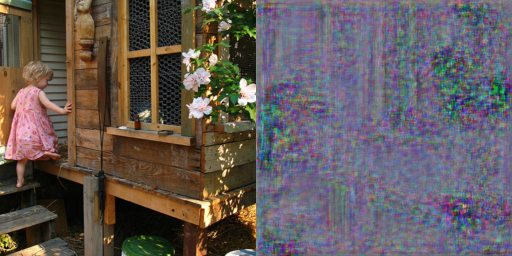

In [29]:
Image.fromarray(np.hstack([
    torch_image_to_numpy(dataset[0][0]),
    torch_image_to_numpy(transformer(dataset[0][0].unsqueeze(0).to(device)).squeeze(0).detach().cpu()),
]))

## Обучение

### Content loss

Лосс в style transfer состоит из двух частей. Первая из них — content loss, отвечающий за то, чтобы сохранять семантику картинки. Также его называют feature reconstruction loss или perceptual loss. Формула для него такая:

$$
l_{\text{content}}(\hat y, y) = 
\operatorname{MSELoss} \left( \text{VGG}_j(\hat y), \text{VGG}_j (y) \right)
$$

Здесь $\hat y$ — батч сгенерированных изображений, $y$ — батч из content images, VGG подразумевает уже подготовленную нами VGG-16, а $j$ — это индекс слоя в ней. Мы будем использовать $j = \text{relu2_2}$. $B$, $C_j$, $H_j$ и $W_j$ — это размеры соответствующего тензора активаций.

In [30]:
def get_content_loss(gen_features, content_features):
    return F.mse_loss(gen_features.relu2_2, content_features.relu2_2)

### Style loss

Вторая компонента лосса — это style loss (или style reconstruction loss). Он записывается немного сложнее:

$$
l_{\text{style}}(\hat y, y) = \sum_{j} \operatorname{MSELoss} \left( \frac 1 {C_j H_j W_j} \text{Gram}\left[ \text{VGG}_j(\hat y) \right], \frac 1 {C_j H_j W_j} \text{Gram}\left[\text{VGG}_j (y)\right] \right)
$$

Здесь $\text{Gram}_j$ — это матрица Грама для активаций $j$-го слоя. Вообще, матрица Грама — это матрица, состоящая из скалярных произведений. Чтобы объяснить, какие скалярные произведения имеются в виду в этом случае, вспомним, что для каждого элемента батча активации $j$-го слоя имеют форму $C_j \times H_j \times W_j$. Теперь представим, что $f$ — это результат решейпа тензора активаций в форму $C_j \times H_j \cdot W_j$. Тогда матрица Грама — это такая матрица:

```
                        |----------|
                        |   C_j    |
    |---------------|   |          |   |----------|
    |   W_j * H_j   |   |          |   |   C_j    |
    |C_j            | x |W_j * H_j | = |C_j       |
    |               |   |          |   |          |
    |---------------|   |          |   |----------|
                        |          |
                        |----------|
```

То есть для каждого канала мы считаем скалярное произведение с каждым другим каналом по пространственным размерностям. Идея здесь в том, что это полностью уничтожает всю пространственную информацию.

Мы будем использовать style loss на всех слоях, которые мы подготовили в нашем шаблоне `Vgg16`.

Примечание: вполне возможно, что от такого количества коэффициентов можно избавиться, потюнив вес style loss в общем лоссе. Я позаимствовал эту схему из примера [`fast_neural_style`](https://github.com/pytorch/examples/tree/master/fast_neural_style).

In [31]:
def gram_matrix(t):
    b, c, h, w = t.shape

    # Реализуйте вычисление матрицы Грама.
    # Это можно сделать многими способами. Возможно, вам понадобятся какие-то из этих функций:
    # transpose, bmm, matmul, einsum

    features = t.reshape(b, c, h * w)
    features_t = features.transpose(1, 2)
    gram = torch.bmm(features, features_t)

    # В одну строку это можно сделать так:
    # gram = torch.einsum('bchw,bdhw->bcd', features, features)
    
    return gram / (c * h * w)

In [32]:
def get_style_loss(gen_gram_matrices, style_gram_matrices):
    # {gen,style}_gram_matrices — это списки из 4 элементов, каждый из которых является матрицей Грама
    return sum(
        F.mse_loss(gen_gram_matrix, style_gram_matrix)
        for (gen_gram_matrix, style_gram_matrix)
        in zip(gen_gram_matrices, style_gram_matrices)
    )

### Обучающий цикл

In [33]:
opt = torch.optim.Adam(transformer.parameters(), lr=1e-3)

In [34]:
def train(transformer, opt, style_tensor, content_tensor, dataloader, vgg, device, tb_dir,
          epochs=2, content_weight=1e5, style_weight=1e10):
    style_tensor = style_tensor.repeat(dataloader.batch_size, 1, 1, 1)  # to avoid a warning in F.mse_loss
    style_tensor = style_tensor.to(device)

    # Посчитайте список из матриц Грама для стилевой картинки
    style_features = vgg(style_tensor)
    style_gram_matrices = [gram_matrix(f) for f in style_features]

    content_tensor = content_tensor.unsqueeze(0).to(device)
    
    batch_idx = 0
    
    with SummaryWriter(log_dir=str(tb_dir / get_datetime())) as writer:
        for e in range(epochs):
            for content_batch, _ in tqdm(dataloader):
                content_batch = content_batch.to(device)

                # Пропустите батч через генератор
                gen_batch = transformer(content_batch)

                # Посчитайте активации VGG на сгенерированных картинках
                gen_features = vgg(gen_batch)
                content_features = vgg(content_batch)

                # Посчитайте content loss
                content_loss = get_content_loss(gen_features, content_features)

                # Посчитайте матрицы Грама по активациям сгенерированных картинок
                gen_gram_matrices = [gram_matrix(f) for f in gen_features]

                # Это нужно, чтобы избежать проблем на последнем батче
                style_gram_matrices_truncated = [
                    style_gram_matrix[:content_batch.shape[0]] for style_gram_matrix in style_gram_matrices
                ]

                # Посчитайте style loss (используя style_gram_matrices_truncated)
                style_loss = get_style_loss(gen_gram_matrices, style_gram_matrices_truncated)

                # Посчитайте итоговый лосс с весами content_weight и style_weight
                total_loss = content_weight * content_loss + style_weight * style_loss

                # Сделайте шаг оптимизации
                opt.zero_grad()
                total_loss.backward()
                opt.step()
                
                writer.add_scalar('losses/content', content_loss.item(), batch_idx)
                writer.add_scalar('losses/style', style_loss.item(), batch_idx)
                writer.add_scalar('losses/total', total_loss.item(), batch_idx)

                if (batch_idx + 1) % 100 == 0:
                    transformer.eval()
                    with torch.no_grad():
                        y = transformer(content_tensor)
                        writer.add_image('image', y.squeeze(0), batch_idx)
                    transformer.train()
                
                batch_idx += 1

In [35]:
tb_dir = Path('tb_logs')

In [36]:
%tensorboard --port 6006 --logdir $tb_dir

Output hidden; open in https://colab.research.google.com to view.

In [37]:
train(transformer, opt, style_tensor, content_tensor, dataloader, vgg, device, tb_dir)

На всякий случай ещё раз посмотрим, что наша модель выдаёт на валидационной картинке.

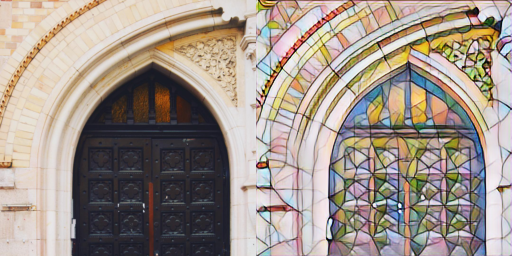

In [38]:
Image.fromarray(np.hstack([
    torch_image_to_numpy(content_tensor),
    torch_image_to_numpy(transformer(content_tensor.unsqueeze(0).to(device)).squeeze(0).detach().cpu()),
]))

А теперь погоняем нашу модель на разных картинках из интернета.

In [39]:
def stylize(url, factor=4):
    image = get_image(url)

    w, h = image.size
    new_w = w // factor * factor
    new_h = h // factor * factor

    # Почему тут необходим CenterCrop? Почему factor именно 4?
    transform_no_resize = transforms.Compose([
        transforms.CenterCrop((new_h, new_w)),
        transforms.ToTensor()
    ])

    image_tensor = transform_no_resize(image)
    assert image_tensor.shape[1:] == (new_h, new_w)

    with torch.no_grad():
        stylized_tensor = transformer(image_tensor.unsqueeze(0).to(device)).squeeze(0).cpu()

    assert image_tensor.shape == stylized_tensor.shape

    return Image.fromarray(
        np.hstack([
            torch_image_to_numpy(image_tensor),
            torch_image_to_numpy(stylized_tensor),
        ])
    )

In [40]:
stylize(content_url)

Output hidden; open in https://colab.research.google.com to view.

In [41]:
stylize('https://upload.wikimedia.org/wikipedia/commons/thumb/e/ec/Mona_Lisa%2C_by_Leonardo_da_Vinci%2C_from_C2RMF_retouched.jpg/515px-Mona_Lisa%2C_by_Leonardo_da_Vinci%2C_from_C2RMF_retouched.jpg')

Output hidden; open in https://colab.research.google.com to view.

In [42]:
stylize('https://data.whicdn.com/images/93462738/original.jpg')

Output hidden; open in https://colab.research.google.com to view.

Кажется, что на больших картинках модель рисует очень мелкие детали витража — да и вообще эти детали имеют более-менее одинаковый размер в пикселях. А как бы сделать так, чтобы эти детали были разного размера?